# Preliminares

## Librerías

In [6]:
import time
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pandas as pd
import scipy.optimize as opt
import os
from pathlib import Path
from typing import NamedTuple, List
from dataclasses import dataclass

## Directorios

In [7]:
os.chdir(Path("D:/PhysicsResearch/projects/Laboratorio 3/Clase 4 (1-9)"))

In [8]:
@dataclass
class Experimento:
    R: float
    L: float
    C: float
    path: Path
    label: str

In [9]:
experimento1 = Experimento(19.0, 0.01, 0.00001, Path("exp1"), "Experimento 1")
experimento2 = Experimento(984.0, 0.01, 0.00001, Path("exp2"), "Experimento 2")
experimento3 = Experimento(211, 1, 0.00001, Path("exp3"), "Experimento 3")
experimento4 = Experimento(211, 1, 0.00001, Path("exp4"), "Experimento 4")
experimento5 = Experimento(316, 1, 0.00001, Path("exp5"), "Experimento 5")
experimento6 = Experimento(316, 1, 0.00001, Path("exp6"), "Experimento 6")
experimento7 = Experimento(632, 1, 0.00001, Path("exp7"), "Experimento 7")

In [15]:
def recuperar_frecuencias_csvs(path):
    frecuencias = []
    datasets = []
    files = [f for f in path.iterdir() if f.is_file() and f.suffix == ".csv"]
    for file in files:
        df = pd.read_csv(file)
        datasets.append(df)
        freq = float(file.stem)
        frecuencias.append(freq)

    return frecuencias, datasets

def obtener_tiempos_voltajes(dataset):
    tiempos = dataset["ts"].to_numpy()
    v1 = dataset["VCH1s"].to_numpy()
    v2 = dataset["VCH2s"].to_numpy()
    return tiempos, v1, v2

def ajustar_senoidal(tiempos, voltajes, frecuencia):
    def senoidal(t, A, w, phi, C):
        return A * np.sin(w * t + phi) + C

    # Estimación inicial de parámetros
    A0 = (np.max(voltajes) - np.min(voltajes)) / 2
    w0 = 2 * np.pi * frecuencia
    phi0 = 0
    C0 = np.mean(voltajes)

    popt, pcov = opt.curve_fit(senoidal, tiempos, voltajes, p0=[A0, w0, phi0, C0])
    return popt, pcov

def arreglar_desfasajes(frecuencias, phi1s, phi2s):
    diferencia_cruda = phi1s - phi2s
    desfasaje_wrapped = (diferencia_cruda + np.pi) % (2 * np.pi) - np.pi
    return np.unwrap(desfasaje_wrapped)

# Experimentos

In [31]:
def senoidal(t, A, w, phi, C):
    return A * np.sin(w * t + phi) + C

def transferencia(x, Q):
    return 1 / np.sqrt(1 + (Q**2 * (x - 1 / x)**2))

def desfasajemodelo(x, Q):
    return -np.arctan(Q * (x - 1 / x))

## Experimento 1

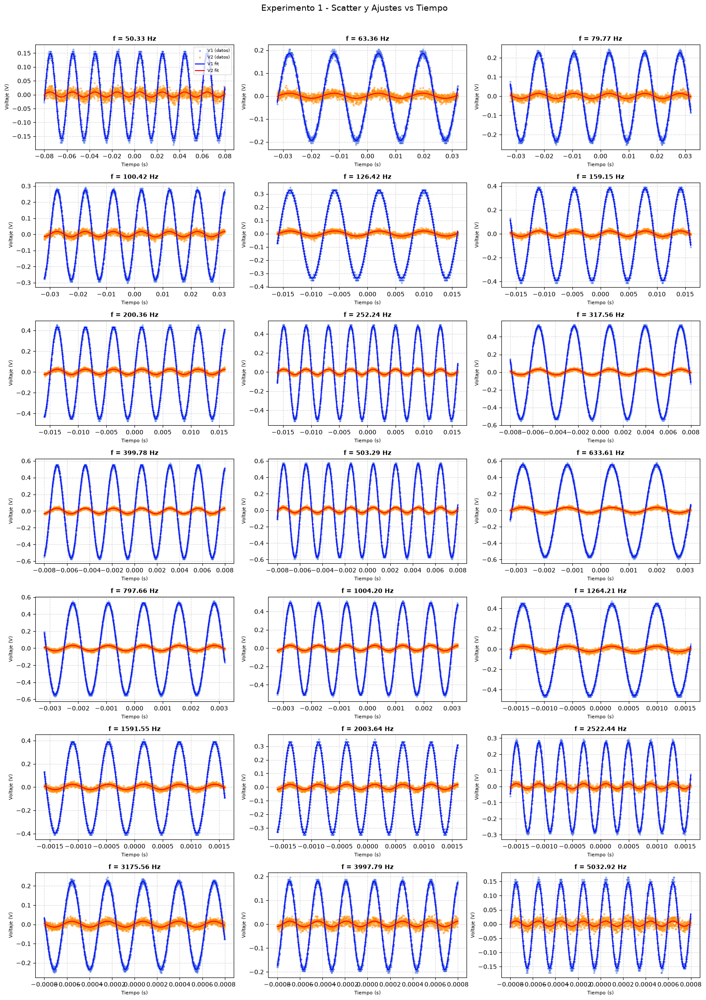

Parámetros ajustados para la transferencia: [-0.36808826]
Frecuencia de resonancia (f0): 503.2921210448704
El Q esperado es : 1.6643566632465152
El Q corregido es: 0.3764616262105213
El Q estimado es: -0.3680882610939812


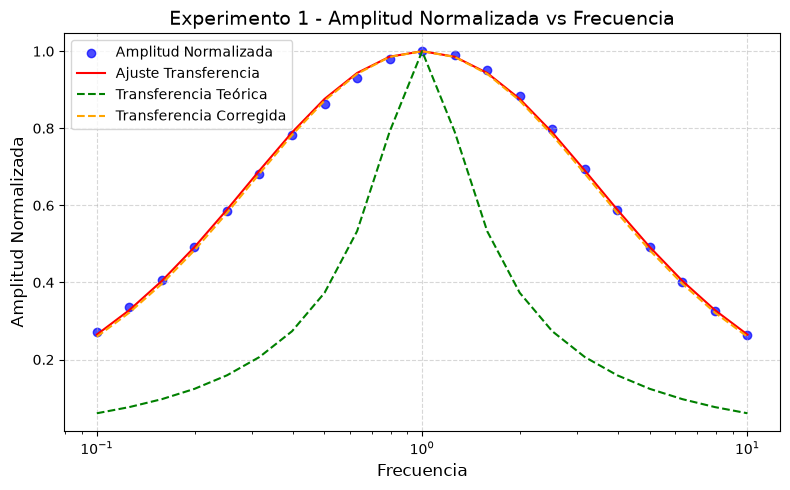

In [30]:
def analisis_experimento_1():
    experimento = experimento1
    R = experimento.R
    L = experimento.L
    C = experimento.C
    f0 = 1 / (2 * np.pi * np.sqrt(L * C))
    Q = 1 / R * np.sqrt(L / C)
    Qcorregido = 1 / (R + 50 + 15) * np.sqrt(L / C)
    frecuencias, datasets = recuperar_frecuencias_csvs(experimento.path)

    # Ordenar por frecuencia ascendente
    indices_ordenados = np.argsort(frecuencias)
    frecuencias = [frecuencias[i] for i in indices_ordenados]
    datasets = [datasets[i] for i in indices_ordenados]
    n = len(frecuencias)

    # Configurar cuadricula de subplots (3 columnas)
    ncols = 3
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 3.2 * nrows), sharex=False)
    axes = axes.flatten()

    amplitudes1 = []
    amplitudes2 = []

    for i in range(n):
        ax = axes[i]
        frecuencia = frecuencias[i]
        dataset = datasets[i]
        tiempos, v1s, v2s = obtener_tiempos_voltajes(dataset)

        popt1, pcov1 = ajustar_senoidal(tiempos, v1s, frecuencia)
        popt2, pcov2 = ajustar_senoidal(tiempos, v2s, frecuencia)

        t_fit = np.linspace(tiempos.min(), tiempos.max(), 500)
        fit1 = senoidal(t_fit, *popt1)
        fit2 = senoidal(t_fit, *popt2)

        # Scatter de datos crudos
        ax.scatter(tiempos, v1s, label='V1 (datos)', color='royalblue', alpha=0.4, s=6)
        ax.scatter(tiempos, v2s, label='V2 (datos)', color='darkorange', alpha=0.4, s=6)

        # Lineas de ajuste
        ax.plot(t_fit, fit1, label='V1 fit', color='blue', linewidth=1.5)
        ax.plot(t_fit, fit2, label='V2 fit', color='red', linewidth=1.5)

        ax.set_title(f'f = {frecuencia:.2f} Hz', fontsize=10, fontweight='bold')
        ax.set_xlabel('Tiempo (s)', fontsize=8)
        ax.set_ylabel('Voltaje (V)', fontsize=8)
        ax.grid(True, linestyle='--', alpha=0.5)
        if i == 0:
            ax.legend(fontsize=7, loc='upper right')

        amplitudes1.append(popt1[0])
        amplitudes2.append(popt2[0])

    # Ocultar ejes sobrantes
    for j in range(n, len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle(f'{experimento.label} - Scatter y Ajustes vs Tiempo', fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()

    amplitudes1 = np.array(amplitudes1)
    amplitudes2 = np.array(amplitudes2)

    amplitudes = amplitudes1 - amplitudes2

    amplitudesnorm = amplitudes/np.max(amplitudes)
    frecuencias_normalizadas = np.array(frecuencias) / f0

    popt_transferencia, pcov_transferencia = opt.curve_fit(transferencia, frecuencias_normalizadas, amplitudesnorm, p0=[Q])
    print("Parámetros ajustados para la transferencia:", popt_transferencia)

    print("Frecuencia de resonancia (f0):", f0)
    print("El Q esperado es :", Q)
    print("El Q corregido es:", Qcorregido)
    print("El Q estimado es:", popt_transferencia[0])

    fig, ax = plt.subplots(figsize=(8, 5))

    ax.scatter(frecuencias_normalizadas, amplitudesnorm, color='blue', label='Amplitud Normalizada', alpha=0.7)
    ax.plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, *popt_transferencia), color='red', label='Ajuste Transferencia', linewidth=1.5)
    ax.plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, Q), color='green', label='Transferencia Teórica', linewidth=1.5, linestyle='--')
    ax.plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, Qcorregido), color='orange', label='Transferencia Corregida', linewidth=1.5, linestyle='--')
    ax.set_xscale('log')
    ax.set_xlabel('Frecuencia', fontsize=12)
    ax.set_ylabel('Amplitud Normalizada', fontsize=12)
    ax.set_title(f'{experimento.label} - Amplitud Normalizada vs Frecuencia', fontsize=14)
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(fontsize=10)

    plt.tight_layout()
    plt.show()



analisis_experimento_1()


## Experimento 2

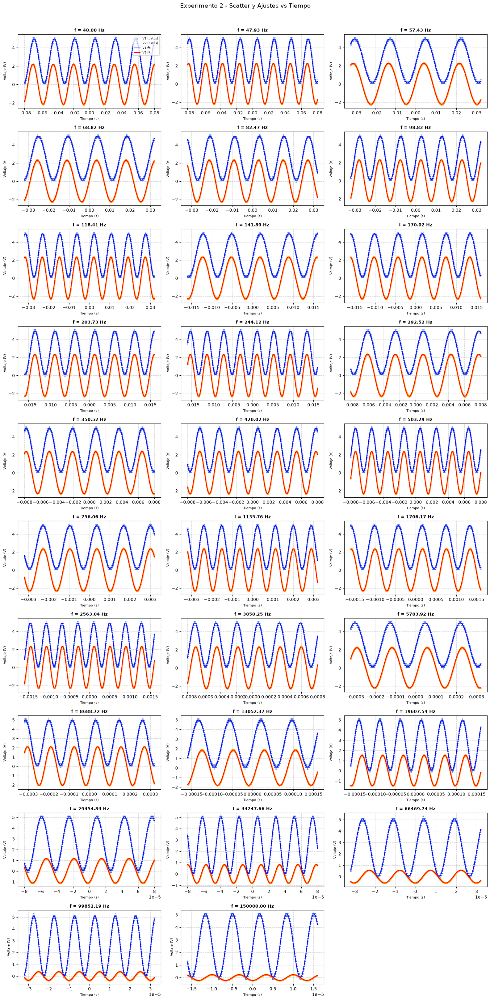

Frecuencia de resonancia (f0): 503.2921210448704
El Q esperado es : 0.03213696809114207
El Q corregido es: 0.030145640230394462
El Q estimado es: 0.03467758399075344
El Q estimado por desfasaje es: -0.03198669729039681


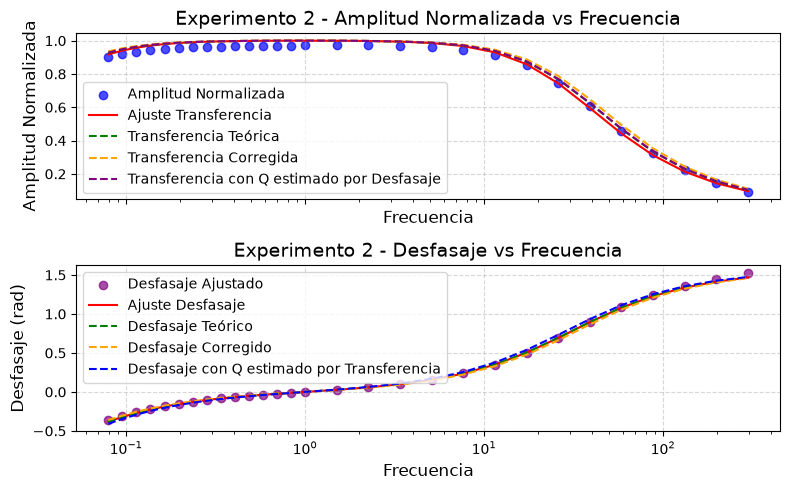

In [38]:
def analisis_experimento_2():
    experimento = experimento2
    R = experimento.R
    L = experimento.L
    C = experimento.C
    f0 = 1 / (2 * np.pi * np.sqrt(L * C))
    Q = 1 / R * np.sqrt(L / C)
    Qcorregido = 1 / (R + 50 + 15) * np.sqrt(L / C)
    frecuencias, datasets = recuperar_frecuencias_csvs(experimento.path)

    # Ordenar por frecuencia ascendente
    indices_ordenados = np.argsort(frecuencias)
    frecuencias = [frecuencias[i] for i in indices_ordenados]
    datasets = [datasets[i] for i in indices_ordenados]
    n = len(frecuencias)

    # Configurar cuadricula de subplots (3 columnas)
    ncols = 3
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 3.2 * nrows), sharex=False)
    axes = axes.flatten()

    amplitudes1 = []
    amplitudes2 = []
    phi1s = []
    phi2s = []

    for i in range(n):
        ax = axes[i]
        frecuencia = frecuencias[i]
        dataset = datasets[i]
        tiempos, v1s, v2s = obtener_tiempos_voltajes(dataset)

        popt1, pcov1 = ajustar_senoidal(tiempos, v1s, frecuencia)
        popt2, pcov2 = ajustar_senoidal(tiempos, v2s, frecuencia)

        t_fit = np.linspace(tiempos.min(), tiempos.max(), 500)
        fit1 = senoidal(t_fit, *popt1)
        fit2 = senoidal(t_fit, *popt2)

        # Scatter de datos crudos
        ax.scatter(tiempos, v1s, label='V1 (datos)', color='royalblue', alpha=0.4, s=6)
        ax.scatter(tiempos, v2s, label='V2 (datos)', color='darkorange', alpha=0.4, s=6)

        # Lineas de ajuste
        ax.plot(t_fit, fit1, label='V1 fit', color='blue', linewidth=1.5)
        ax.plot(t_fit, fit2, label='V2 fit', color='red', linewidth=1.5)

        ax.set_title(f'f = {frecuencia:.2f} Hz', fontsize=10, fontweight='bold')
        ax.set_xlabel('Tiempo (s)', fontsize=8)
        ax.set_ylabel('Voltaje (V)', fontsize=8)
        ax.grid(True, linestyle='--', alpha=0.5)
        if i == 0:
            ax.legend(fontsize=7, loc='upper right')

        amplitudes1.append(popt1[0])
        amplitudes2.append(popt2[0])
        phi1s.append(popt1[2])
        phi2s.append(popt2[2])

    # Ocultar ejes sobrantes
    for j in range(n, len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle(f'{experimento.label} - Scatter y Ajustes vs Tiempo', fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()

    amplitudes1 = np.array(amplitudes1)
    amplitudes2 = np.array(amplitudes2)

    amplitudes = amplitudes2

    amplitudesnorm = amplitudes/amplitudes1
    frecuencias_normalizadas = np.array(frecuencias) / f0

    popt_transferencia, pcov_transferencia = opt.curve_fit(transferencia, frecuencias_normalizadas, amplitudesnorm, p0=[Q])
    popt_desfasaje, pcov_desfasaje = opt.curve_fit(desfasajemodelo, frecuencias_normalizadas, arreglar_desfasajes(frecuencias_normalizadas, np.array(phi1s), np.array(phi2s)), p0=[Q])

    print("Frecuencia de resonancia (f0):", f0)
    print("El Q esperado es :", Q)
    print("El Q corregido es:", Qcorregido)
    print("El Q estimado es:", popt_transferencia[0])
    print("El Q estimado por desfasaje es:", popt_desfasaje[0])

    fig, ax = plt.subplots(2, 1, figsize=(8, 5), sharex=True)

    ax[0].scatter(frecuencias_normalizadas, amplitudesnorm, color='blue', label='Amplitud Normalizada', alpha=0.7)
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, *popt_transferencia), color='red', label='Ajuste Transferencia', linewidth=1.5)
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, Q), color='green', label='Transferencia Teórica', linewidth=1.5, linestyle='--')
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, Qcorregido), color='orange', label='Transferencia Corregida', linewidth=1.5, linestyle='--')
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, popt_desfasaje[0]), color='purple', label='Transferencia con Q estimado por Desfasaje', linewidth=1.5, linestyle='--')

    ax[0].set_xscale('log')
    ax[0].set_ylabel('Amplitud Normalizada', fontsize=12)
    ax[0].set_title(f'{experimento.label} - Amplitud Normalizada vs Frecuencia', fontsize=14)
    ax[0].grid(True, linestyle='--', alpha=0.5)
    ax[0].legend(fontsize=10)
    ax[0].set_xlabel('Frecuencia', fontsize=12)

    ax[1].scatter(frecuencias_normalizadas, arreglar_desfasajes(frecuencias_normalizadas, np.array(phi1s), np.array(phi2s)), color='purple', label='Desfasaje Ajustado', alpha=0.7)
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, *popt_desfasaje), color='red', label='Ajuste Desfasaje', linewidth=1.5)
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, -Q), color='green', label='Desfasaje Teórico', linewidth=1.5, linestyle='--')
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, -Qcorregido), color='orange', label='Desfasaje Corregido', linewidth=1.5, linestyle='--')
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, -popt_transferencia[0]), color='blue', label='Desfasaje con Q estimado por Transferencia', linewidth=1.5, linestyle='--')

    ax[1].set_xscale('log')
    ax[1].set_xlabel('Frecuencia', fontsize=12)
    ax[1].set_ylabel('Desfasaje (rad)', fontsize=12)
    ax[1].set_title(f'{experimento.label} - Desfasaje vs Frecuencia', fontsize=14)
    ax[1].grid(True, linestyle='--', alpha=0.5)
    ax[1].legend(fontsize=10)

    plt.tight_layout()
    plt.show()



analisis_experimento_2()

## Experimento 3

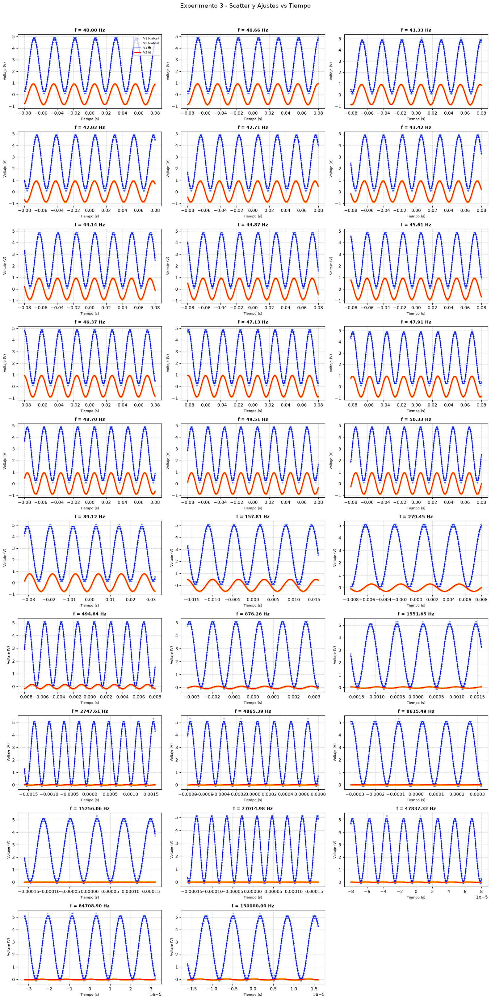

Frecuencia de resonancia (f0): 50.329212104487034
El Q esperado es : 1.4987097915489949
El Q corregido es: 0.6176323555016365
El Q estimado es: 13.711926044288187
El Q estimado por desfasaje es: -0.5621507124238224


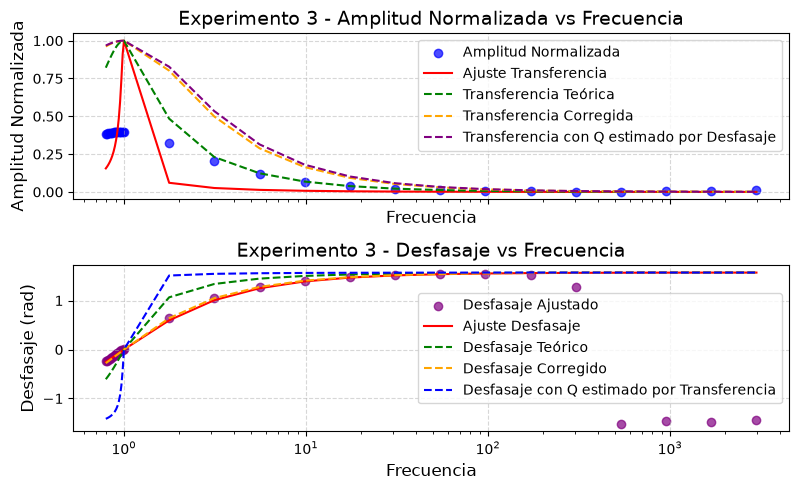

In [39]:
def analisis_experimento_3(): #CH1 en Circuito, se desprecia impedancia de salida
    experimento = experimento3
    R = experimento.R
    L = experimento.L
    C = experimento.C
    f0 = 1 / (2 * np.pi * np.sqrt(L * C))
    Q = 1 / R * np.sqrt(L / C)
    Qcorregido = 1 / (R + 301) * np.sqrt(L / C)
    frecuencias, datasets = recuperar_frecuencias_csvs(experimento.path)

    # Ordenar por frecuencia ascendente
    indices_ordenados = np.argsort(frecuencias)
    frecuencias = [frecuencias[i] for i in indices_ordenados]
    datasets = [datasets[i] for i in indices_ordenados]
    n = len(frecuencias)

    # Configurar cuadricula de subplots (3 columnas)
    ncols = 3
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 3.2 * nrows), sharex=False)
    axes = axes.flatten()

    amplitudes1 = []
    amplitudes2 = []
    phi1s = []
    phi2s = []

    for i in range(n):
        ax = axes[i]
        frecuencia = frecuencias[i]
        dataset = datasets[i]
        tiempos, v1s, v2s = obtener_tiempos_voltajes(dataset)

        popt1, pcov1 = ajustar_senoidal(tiempos, v1s, frecuencia)
        popt2, pcov2 = ajustar_senoidal(tiempos, v2s, frecuencia)

        t_fit = np.linspace(tiempos.min(), tiempos.max(), 500)
        fit1 = senoidal(t_fit, *popt1)
        fit2 = senoidal(t_fit, *popt2)

        # Scatter de datos crudos
        ax.scatter(tiempos, v1s, label='V1 (datos)', color='royalblue', alpha=0.4, s=6)
        ax.scatter(tiempos, v2s, label='V2 (datos)', color='darkorange', alpha=0.4, s=6)

        # Lineas de ajuste
        ax.plot(t_fit, fit1, label='V1 fit', color='blue', linewidth=1.5)
        ax.plot(t_fit, fit2, label='V2 fit', color='red', linewidth=1.5)

        ax.set_title(f'f = {frecuencia:.2f} Hz', fontsize=10, fontweight='bold')
        ax.set_xlabel('Tiempo (s)', fontsize=8)
        ax.set_ylabel('Voltaje (V)', fontsize=8)
        ax.grid(True, linestyle='--', alpha=0.5)
        if i == 0:
            ax.legend(fontsize=7, loc='upper right')

        amplitudes1.append(popt1[0])
        amplitudes2.append(popt2[0])
        phi1s.append(popt1[2])
        phi2s.append(popt2[2])

    # Ocultar ejes sobrantes
    for j in range(n, len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle(f'{experimento.label} - Scatter y Ajustes vs Tiempo', fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()

    amplitudes1 = np.array(amplitudes1)
    amplitudes2 = np.array(amplitudes2)

    amplitudes = amplitudes2

    amplitudesnorm = amplitudes/amplitudes1
    frecuencias_normalizadas = np.array(frecuencias) / f0

    popt_transferencia, pcov_transferencia = opt.curve_fit(transferencia, frecuencias_normalizadas, amplitudesnorm, p0=[Q])
    popt_desfasaje, pcov_desfasaje = opt.curve_fit(desfasajemodelo, frecuencias_normalizadas, arreglar_desfasajes(frecuencias_normalizadas, np.array(phi1s), np.array(phi2s)), p0=[Q])

    print("Frecuencia de resonancia (f0):", f0)
    print("El Q esperado es :", Q)
    print("El Q corregido es:", Qcorregido)
    print("El Q estimado es:", popt_transferencia[0])
    print("El Q estimado por desfasaje es:", popt_desfasaje[0])

    fig, ax = plt.subplots(2, 1, figsize=(8, 5), sharex=True)

    ax[0].scatter(frecuencias_normalizadas, amplitudesnorm, color='blue', label='Amplitud Normalizada', alpha=0.7)
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, *popt_transferencia), color='red', label='Ajuste Transferencia', linewidth=1.5)
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, Q), color='green', label='Transferencia Teórica', linewidth=1.5, linestyle='--')
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, Qcorregido), color='orange', label='Transferencia Corregida', linewidth=1.5, linestyle='--')
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, popt_desfasaje[0]), color='purple', label='Transferencia con Q estimado por Desfasaje', linewidth=1.5, linestyle='--')

    ax[0].set_xscale('log')
    ax[0].set_ylabel('Amplitud Normalizada', fontsize=12)
    ax[0].set_title(f'{experimento.label} - Amplitud Normalizada vs Frecuencia', fontsize=14)
    ax[0].grid(True, linestyle='--', alpha=0.5)
    ax[0].legend(fontsize=10)
    ax[0].set_xlabel('Frecuencia', fontsize=12)

    ax[1].scatter(frecuencias_normalizadas, arreglar_desfasajes(frecuencias_normalizadas, np.array(phi1s), np.array(phi2s)), color='purple', label='Desfasaje Ajustado', alpha=0.7)
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, *popt_desfasaje), color='red', label='Ajuste Desfasaje', linewidth=1.5)
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, -Q), color='green', label='Desfasaje Teórico', linewidth=1.5, linestyle='--')
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, -Qcorregido), color='orange', label='Desfasaje Corregido', linewidth=1.5, linestyle='--')
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, -popt_transferencia[0]), color='blue', label='Desfasaje con Q estimado por Transferencia', linewidth=1.5, linestyle='--')

    ax[1].set_xscale('log')
    ax[1].set_xlabel('Frecuencia', fontsize=12)
    ax[1].set_ylabel('Desfasaje (rad)', fontsize=12)
    ax[1].set_title(f'{experimento.label} - Desfasaje vs Frecuencia', fontsize=14)
    ax[1].grid(True, linestyle='--', alpha=0.5)
    ax[1].legend(fontsize=10)

    plt.tight_layout()
    plt.show()

analisis_experimento_3()

## Experimento 4


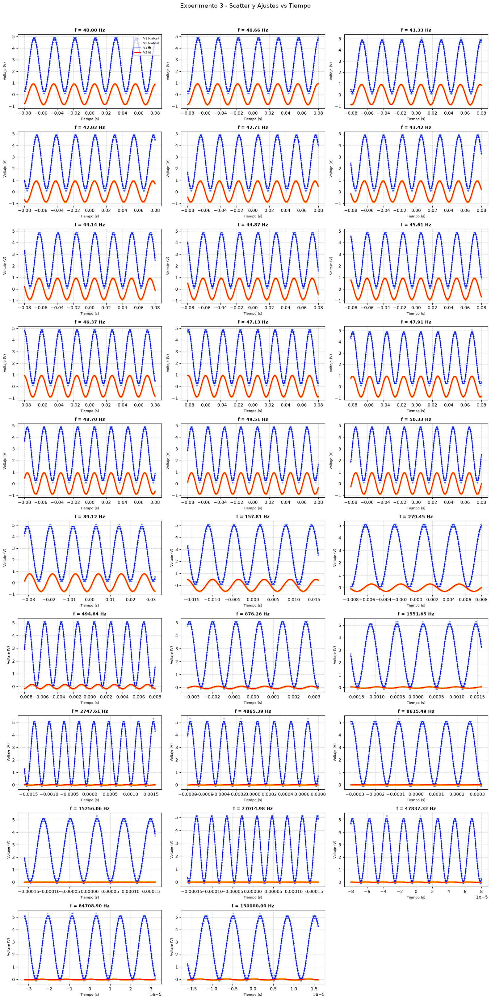

Frecuencia de resonancia (f0): 50.329212104487034
El Q esperado es : 1.4987097915489949
El Q corregido es: 0.5626828576812062
El Q estimado es: 13.711926044288187
El Q estimado por desfasaje es: -0.5621507124238224


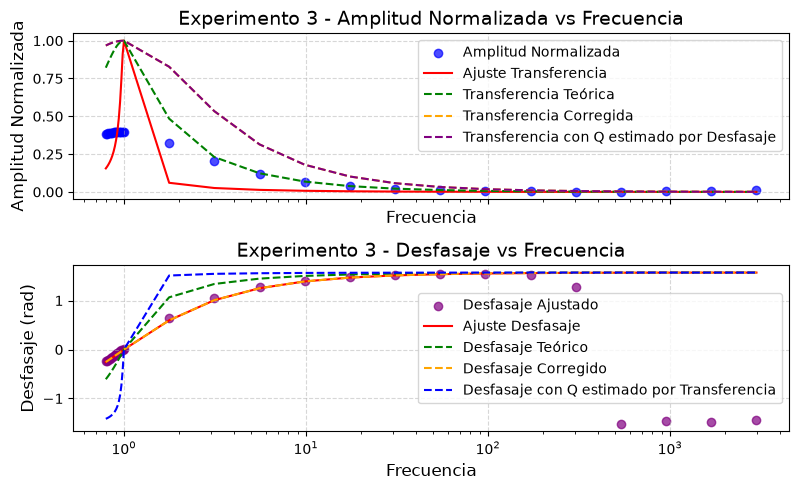

In [42]:
def analisis_experimento_4(): #CH1 en Osciloscopio, se considera la impedancia de salida
    experimento = experimento3
    R = experimento.R
    L = experimento.L
    C = experimento.C
    f0 = 1 / (2 * np.pi * np.sqrt(L * C))
    Q = 1 / R * np.sqrt(L / C)
    Qcorregido = 1 / (R + 301 + 50) * np.sqrt(L / C)
    frecuencias, datasets = recuperar_frecuencias_csvs(experimento.path)

    # Ordenar por frecuencia ascendente
    indices_ordenados = np.argsort(frecuencias)
    frecuencias = [frecuencias[i] for i in indices_ordenados]
    datasets = [datasets[i] for i in indices_ordenados]
    n = len(frecuencias)

    # Configurar cuadricula de subplots (3 columnas)
    ncols = 3
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 3.2 * nrows), sharex=False)
    axes = axes.flatten()

    amplitudes1 = []
    amplitudes2 = []
    phi1s = []
    phi2s = []

    for i in range(n):
        ax = axes[i]
        frecuencia = frecuencias[i]
        dataset = datasets[i]
        tiempos, v1s, v2s = obtener_tiempos_voltajes(dataset)

        popt1, pcov1 = ajustar_senoidal(tiempos, v1s, frecuencia)
        popt2, pcov2 = ajustar_senoidal(tiempos, v2s, frecuencia)

        t_fit = np.linspace(tiempos.min(), tiempos.max(), 500)
        fit1 = senoidal(t_fit, *popt1)
        fit2 = senoidal(t_fit, *popt2)

        # Scatter de datos crudos
        ax.scatter(tiempos, v1s, label='V1 (datos)', color='royalblue', alpha=0.4, s=6)
        ax.scatter(tiempos, v2s, label='V2 (datos)', color='darkorange', alpha=0.4, s=6)

        # Lineas de ajuste
        ax.plot(t_fit, fit1, label='V1 fit', color='blue', linewidth=1.5)
        ax.plot(t_fit, fit2, label='V2 fit', color='red', linewidth=1.5)

        ax.set_title(f'f = {frecuencia:.2f} Hz', fontsize=10, fontweight='bold')
        ax.set_xlabel('Tiempo (s)', fontsize=8)
        ax.set_ylabel('Voltaje (V)', fontsize=8)
        ax.grid(True, linestyle='--', alpha=0.5)
        if i == 0:
            ax.legend(fontsize=7, loc='upper right')

        amplitudes1.append(popt1[0])
        amplitudes2.append(popt2[0])
        phi1s.append(popt1[2])
        phi2s.append(popt2[2])

    # Ocultar ejes sobrantes
    for j in range(n, len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle(f'{experimento.label} - Scatter y Ajustes vs Tiempo', fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()

    amplitudes1 = np.array(amplitudes1)
    amplitudes2 = np.array(amplitudes2)

    amplitudes = amplitudes2

    amplitudesnorm = amplitudes/amplitudes1
    frecuencias_normalizadas = np.array(frecuencias) / f0

    popt_transferencia, pcov_transferencia = opt.curve_fit(transferencia, frecuencias_normalizadas, amplitudesnorm, p0=[Q])
    popt_desfasaje, pcov_desfasaje = opt.curve_fit(desfasajemodelo, frecuencias_normalizadas, arreglar_desfasajes(frecuencias_normalizadas, np.array(phi1s), np.array(phi2s)), p0=[Q])

    print("Frecuencia de resonancia (f0):", f0)
    print("El Q esperado es :", Q)
    print("El Q corregido es:", Qcorregido)
    print("El Q estimado es:", popt_transferencia[0])
    print("El Q estimado por desfasaje es:", popt_desfasaje[0])

    fig, ax = plt.subplots(2, 1, figsize=(8, 5), sharex=True)

    ax[0].scatter(frecuencias_normalizadas, amplitudesnorm, color='blue', label='Amplitud Normalizada', alpha=0.7)
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, *popt_transferencia), color='red', label='Ajuste Transferencia', linewidth=1.5)
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, Q), color='green', label='Transferencia Teórica', linewidth=1.5, linestyle='--')
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, Qcorregido), color='orange', label='Transferencia Corregida', linewidth=1.5, linestyle='--')
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, popt_desfasaje[0]), color='purple', label='Transferencia con Q estimado por Desfasaje', linewidth=1.5, linestyle='--')

    ax[0].set_xscale('log')
    ax[0].set_ylabel('Amplitud Normalizada', fontsize=12)
    ax[0].set_title(f'{experimento.label} - Amplitud Normalizada vs Frecuencia', fontsize=14)
    ax[0].grid(True, linestyle='--', alpha=0.5)
    ax[0].legend(fontsize=10)
    ax[0].set_xlabel('Frecuencia', fontsize=12)

    ax[1].scatter(frecuencias_normalizadas, arreglar_desfasajes(frecuencias_normalizadas, np.array(phi1s), np.array(phi2s)), color='purple', label='Desfasaje Ajustado', alpha=0.7)
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, *popt_desfasaje), color='red', label='Ajuste Desfasaje', linewidth=1.5)
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, -Q), color='green', label='Desfasaje Teórico', linewidth=1.5, linestyle='--')
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, -Qcorregido), color='orange', label='Desfasaje Corregido', linewidth=1.5, linestyle='--')
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, -popt_transferencia[0]), color='blue', label='Desfasaje con Q estimado por Transferencia', linewidth=1.5, linestyle='--')

    ax[1].set_xscale('log')
    ax[1].set_xlabel('Frecuencia', fontsize=12)
    ax[1].set_ylabel('Desfasaje (rad)', fontsize=12)
    ax[1].set_title(f'{experimento.label} - Desfasaje vs Frecuencia', fontsize=14)
    ax[1].grid(True, linestyle='--', alpha=0.5)
    ax[1].legend(fontsize=10)

    plt.tight_layout()
    plt.show()

analisis_experimento_4()

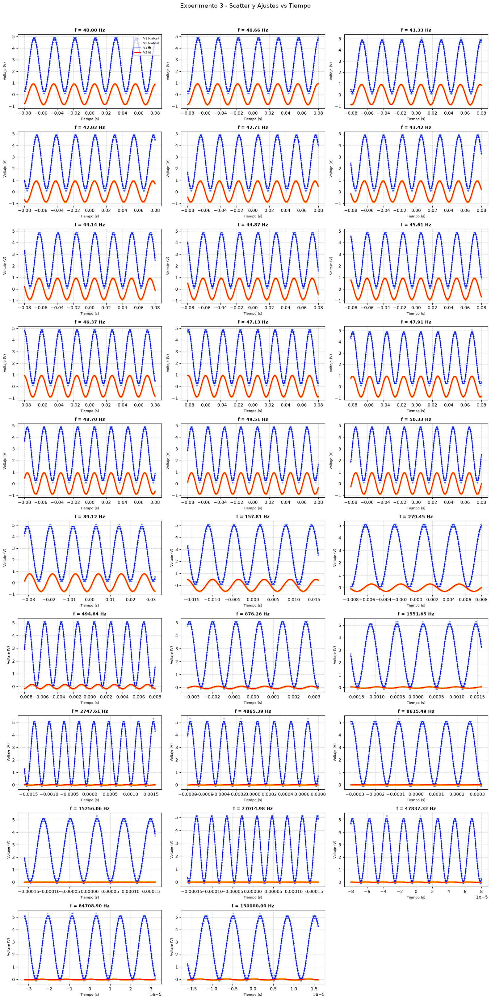

Frecuencia de resonancia (f0): 50.329212104487034
El Q esperado es : 1.4987097915489949
El Q corregido es: 0.6176323555016365
El Q estimado es: 13.711926044288187
El Q estimado por desfasaje es: -0.5621507124238224


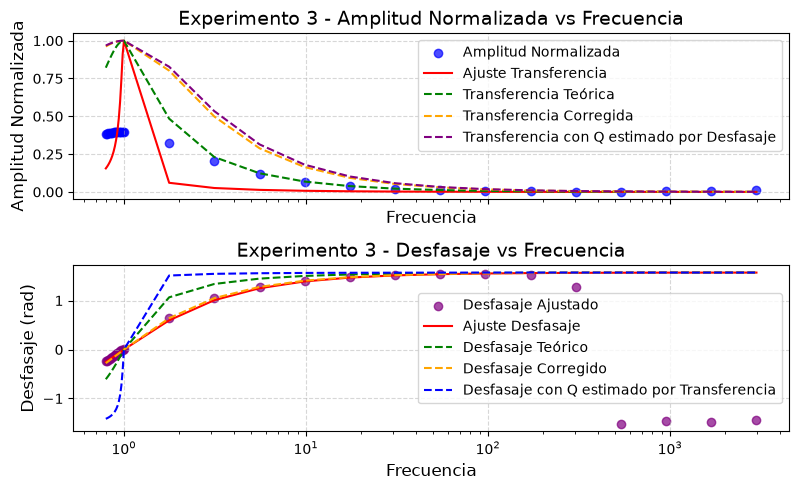

In [43]:
def analisis_experimento_5(): #CH1 en Circuito, no se considera la impedancia de salida
    experimento = experimento3
    R = experimento.R
    L = experimento.L
    C = experimento.C
    f0 = 1 / (2 * np.pi * np.sqrt(L * C))
    Q = 1 / R * np.sqrt(L / C)
    Qcorregido = 1 / (R + 301) * np.sqrt(L / C)
    frecuencias, datasets = recuperar_frecuencias_csvs(experimento.path)

    # Ordenar por frecuencia ascendente
    indices_ordenados = np.argsort(frecuencias)
    frecuencias = [frecuencias[i] for i in indices_ordenados]
    datasets = [datasets[i] for i in indices_ordenados]
    n = len(frecuencias)

    # Configurar cuadricula de subplots (3 columnas)
    ncols = 3
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 3.2 * nrows), sharex=False)
    axes = axes.flatten()

    amplitudes1 = []
    amplitudes2 = []
    phi1s = []
    phi2s = []

    for i in range(n):
        ax = axes[i]
        frecuencia = frecuencias[i]
        dataset = datasets[i]
        tiempos, v1s, v2s = obtener_tiempos_voltajes(dataset)

        popt1, pcov1 = ajustar_senoidal(tiempos, v1s, frecuencia)
        popt2, pcov2 = ajustar_senoidal(tiempos, v2s, frecuencia)

        t_fit = np.linspace(tiempos.min(), tiempos.max(), 500)
        fit1 = senoidal(t_fit, *popt1)
        fit2 = senoidal(t_fit, *popt2)

        # Scatter de datos crudos
        ax.scatter(tiempos, v1s, label='V1 (datos)', color='royalblue', alpha=0.4, s=6)
        ax.scatter(tiempos, v2s, label='V2 (datos)', color='darkorange', alpha=0.4, s=6)

        # Lineas de ajuste
        ax.plot(t_fit, fit1, label='V1 fit', color='blue', linewidth=1.5)
        ax.plot(t_fit, fit2, label='V2 fit', color='red', linewidth=1.5)

        ax.set_title(f'f = {frecuencia:.2f} Hz', fontsize=10, fontweight='bold')
        ax.set_xlabel('Tiempo (s)', fontsize=8)
        ax.set_ylabel('Voltaje (V)', fontsize=8)
        ax.grid(True, linestyle='--', alpha=0.5)
        if i == 0:
            ax.legend(fontsize=7, loc='upper right')

        amplitudes1.append(popt1[0])
        amplitudes2.append(popt2[0])
        phi1s.append(popt1[2])
        phi2s.append(popt2[2])

    # Ocultar ejes sobrantes
    for j in range(n, len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle(f'{experimento.label} - Scatter y Ajustes vs Tiempo', fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()

    amplitudes1 = np.array(amplitudes1)
    amplitudes2 = np.array(amplitudes2)

    amplitudes = amplitudes2

    amplitudesnorm = amplitudes/amplitudes1
    frecuencias_normalizadas = np.array(frecuencias) / f0

    popt_transferencia, pcov_transferencia = opt.curve_fit(transferencia, frecuencias_normalizadas, amplitudesnorm, p0=[Q])
    popt_desfasaje, pcov_desfasaje = opt.curve_fit(desfasajemodelo, frecuencias_normalizadas, arreglar_desfasajes(frecuencias_normalizadas, np.array(phi1s), np.array(phi2s)), p0=[Q])

    print("Frecuencia de resonancia (f0):", f0)
    print("El Q esperado es :", Q)
    print("El Q corregido es:", Qcorregido)
    print("El Q estimado es:", popt_transferencia[0])
    print("El Q estimado por desfasaje es:", popt_desfasaje[0])

    fig, ax = plt.subplots(2, 1, figsize=(8, 5), sharex=True)

    ax[0].scatter(frecuencias_normalizadas, amplitudesnorm, color='blue', label='Amplitud Normalizada', alpha=0.7)
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, *popt_transferencia), color='red', label='Ajuste Transferencia', linewidth=1.5)
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, Q), color='green', label='Transferencia Teórica', linewidth=1.5, linestyle='--')
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, Qcorregido), color='orange', label='Transferencia Corregida', linewidth=1.5, linestyle='--')
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, popt_desfasaje[0]), color='purple', label='Transferencia con Q estimado por Desfasaje', linewidth=1.5, linestyle='--')

    ax[0].set_xscale('log')
    ax[0].set_ylabel('Amplitud Normalizada', fontsize=12)
    ax[0].set_title(f'{experimento.label} - Amplitud Normalizada vs Frecuencia', fontsize=14)
    ax[0].grid(True, linestyle='--', alpha=0.5)
    ax[0].legend(fontsize=10)
    ax[0].set_xlabel('Frecuencia', fontsize=12)

    ax[1].scatter(frecuencias_normalizadas, arreglar_desfasajes(frecuencias_normalizadas, np.array(phi1s), np.array(phi2s)), color='purple', label='Desfasaje Ajustado', alpha=0.7)
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, *popt_desfasaje), color='red', label='Ajuste Desfasaje', linewidth=1.5)
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, -Q), color='green', label='Desfasaje Teórico', linewidth=1.5, linestyle='--')
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, -Qcorregido), color='orange', label='Desfasaje Corregido', linewidth=1.5, linestyle='--')
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, -popt_transferencia[0]), color='blue', label='Desfasaje con Q estimado por Transferencia', linewidth=1.5, linestyle='--')

    ax[1].set_xscale('log')
    ax[1].set_xlabel('Frecuencia', fontsize=12)
    ax[1].set_ylabel('Desfasaje (rad)', fontsize=12)
    ax[1].set_title(f'{experimento.label} - Desfasaje vs Frecuencia', fontsize=14)
    ax[1].grid(True, linestyle='--', alpha=0.5)
    ax[1].legend(fontsize=10)

    plt.tight_layout()
    plt.show()

analisis_experimento_5()

## Experimento 6

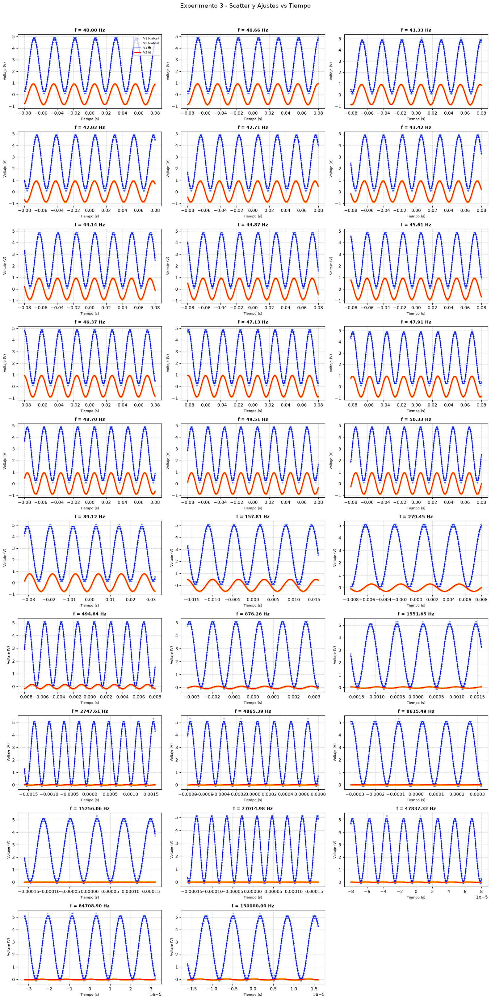

Frecuencia de resonancia (f0): 50.329212104487034
El Q esperado es : 1.4987097915489949
El Q corregido es: 0.5626828576812062
El Q estimado es: 13.711926044288187
El Q estimado por desfasaje es: -0.5621507124238224


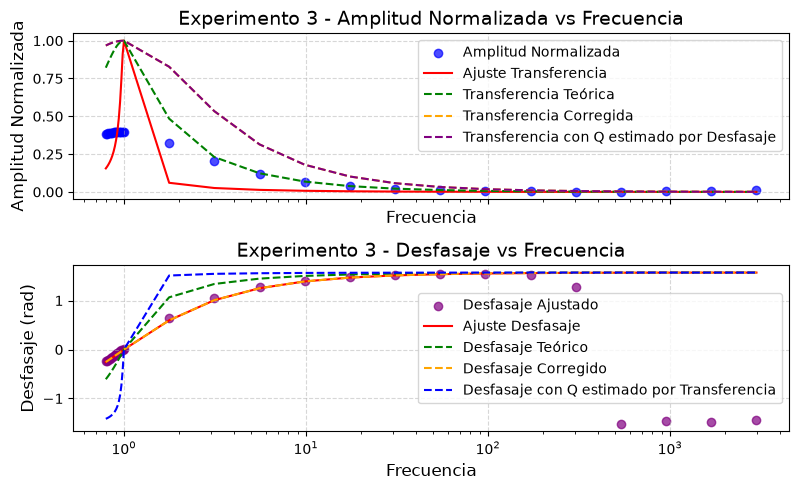

In [45]:
def analisis_experimento_6(): #CH1 en Osciloscopio, se considera la impedancia de salida
    experimento = experimento3
    R = experimento.R
    L = experimento.L
    C = experimento.C
    f0 = 1 / (2 * np.pi * np.sqrt(L * C))
    Q = 1 / R * np.sqrt(L / C)
    Qcorregido = 1 / (R + 301 + 50) * np.sqrt(L / C)
    frecuencias, datasets = recuperar_frecuencias_csvs(experimento.path)

    # Ordenar por frecuencia ascendente
    indices_ordenados = np.argsort(frecuencias)
    frecuencias = [frecuencias[i] for i in indices_ordenados]
    datasets = [datasets[i] for i in indices_ordenados]
    n = len(frecuencias)

    # Configurar cuadricula de subplots (3 columnas)
    ncols = 3
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 3.2 * nrows), sharex=False)
    axes = axes.flatten()

    amplitudes1 = []
    amplitudes2 = []
    phi1s = []
    phi2s = []

    for i in range(n):
        ax = axes[i]
        frecuencia = frecuencias[i]
        dataset = datasets[i]
        tiempos, v1s, v2s = obtener_tiempos_voltajes(dataset)

        popt1, pcov1 = ajustar_senoidal(tiempos, v1s, frecuencia)
        popt2, pcov2 = ajustar_senoidal(tiempos, v2s, frecuencia)

        t_fit = np.linspace(tiempos.min(), tiempos.max(), 500)
        fit1 = senoidal(t_fit, *popt1)
        fit2 = senoidal(t_fit, *popt2)

        # Scatter de datos crudos
        ax.scatter(tiempos, v1s, label='V1 (datos)', color='royalblue', alpha=0.4, s=6)
        ax.scatter(tiempos, v2s, label='V2 (datos)', color='darkorange', alpha=0.4, s=6)

        # Lineas de ajuste
        ax.plot(t_fit, fit1, label='V1 fit', color='blue', linewidth=1.5)
        ax.plot(t_fit, fit2, label='V2 fit', color='red', linewidth=1.5)

        ax.set_title(f'f = {frecuencia:.2f} Hz', fontsize=10, fontweight='bold')
        ax.set_xlabel('Tiempo (s)', fontsize=8)
        ax.set_ylabel('Voltaje (V)', fontsize=8)
        ax.grid(True, linestyle='--', alpha=0.5)
        if i == 0:
            ax.legend(fontsize=7, loc='upper right')

        amplitudes1.append(popt1[0])
        amplitudes2.append(popt2[0])
        phi1s.append(popt1[2])
        phi2s.append(popt2[2])

    # Ocultar ejes sobrantes
    for j in range(n, len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle(f'{experimento.label} - Scatter y Ajustes vs Tiempo', fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()

    amplitudes1 = np.array(amplitudes1)
    amplitudes2 = np.array(amplitudes2)

    amplitudes = amplitudes2

    amplitudesnorm = amplitudes/amplitudes1
    frecuencias_normalizadas = np.array(frecuencias) / f0

    popt_transferencia, pcov_transferencia = opt.curve_fit(transferencia, frecuencias_normalizadas, amplitudesnorm, p0=[Q])
    popt_desfasaje, pcov_desfasaje = opt.curve_fit(desfasajemodelo, frecuencias_normalizadas, arreglar_desfasajes(frecuencias_normalizadas, np.array(phi1s), np.array(phi2s)), p0=[Q])

    print("Frecuencia de resonancia (f0):", f0)
    print("El Q esperado es :", Q)
    print("El Q corregido es:", Qcorregido)
    print("El Q estimado es:", popt_transferencia[0])
    print("El Q estimado por desfasaje es:", popt_desfasaje[0])

    fig, ax = plt.subplots(2, 1, figsize=(8, 5), sharex=True)

    ax[0].scatter(frecuencias_normalizadas, amplitudesnorm, color='blue', label='Amplitud Normalizada', alpha=0.7)
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, *popt_transferencia), color='red', label='Ajuste Transferencia', linewidth=1.5)
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, Q), color='green', label='Transferencia Teórica', linewidth=1.5, linestyle='--')
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, Qcorregido), color='orange', label='Transferencia Corregida', linewidth=1.5, linestyle='--')
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, popt_desfasaje[0]), color='purple', label='Transferencia con Q estimado por Desfasaje', linewidth=1.5, linestyle='--')

    ax[0].set_xscale('log')
    ax[0].set_ylabel('Amplitud Normalizada', fontsize=12)
    ax[0].set_title(f'{experimento.label} - Amplitud Normalizada vs Frecuencia', fontsize=14)
    ax[0].grid(True, linestyle='--', alpha=0.5)
    ax[0].legend(fontsize=10)
    ax[0].set_xlabel('Frecuencia', fontsize=12)

    ax[1].scatter(frecuencias_normalizadas, arreglar_desfasajes(frecuencias_normalizadas, np.array(phi1s), np.array(phi2s)), color='purple', label='Desfasaje Ajustado', alpha=0.7)
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, *popt_desfasaje), color='red', label='Ajuste Desfasaje', linewidth=1.5)
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, -Q), color='green', label='Desfasaje Teórico', linewidth=1.5, linestyle='--')
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, -Qcorregido), color='orange', label='Desfasaje Corregido', linewidth=1.5, linestyle='--')
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, -popt_transferencia[0]), color='blue', label='Desfasaje con Q estimado por Transferencia', linewidth=1.5, linestyle='--')

    ax[1].set_xscale('log')
    ax[1].set_xlabel('Frecuencia', fontsize=12)
    ax[1].set_ylabel('Desfasaje (rad)', fontsize=12)
    ax[1].set_title(f'{experimento.label} - Desfasaje vs Frecuencia', fontsize=14)
    ax[1].grid(True, linestyle='--', alpha=0.5)
    ax[1].legend(fontsize=10)

    plt.tight_layout()
    plt.show()

analisis_experimento_6()

## Experimento 7

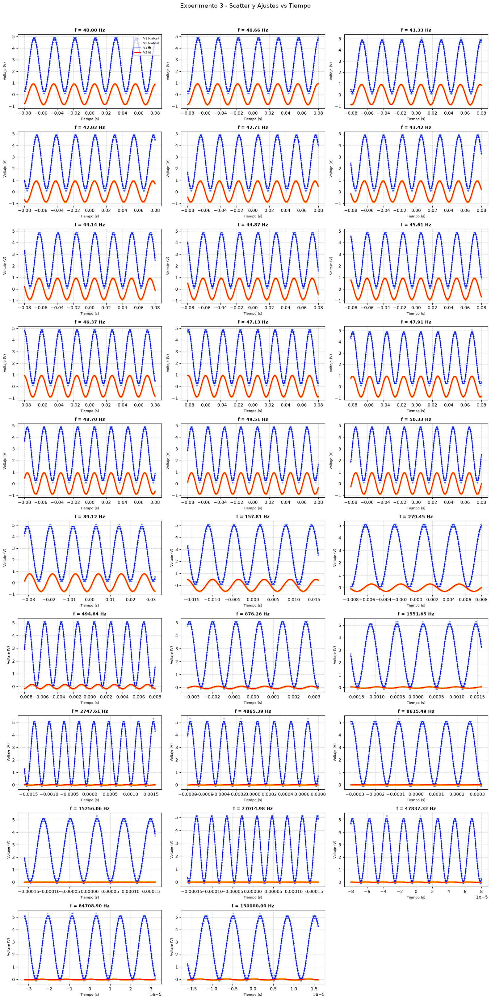

Frecuencia de resonancia (f0): 50.329212104487034
El Q esperado es : 1.4987097915489949
El Q corregido es: 0.6176323555016365
El Q estimado es: 13.711926044288187
El Q estimado por desfasaje es: -0.5621507124238224


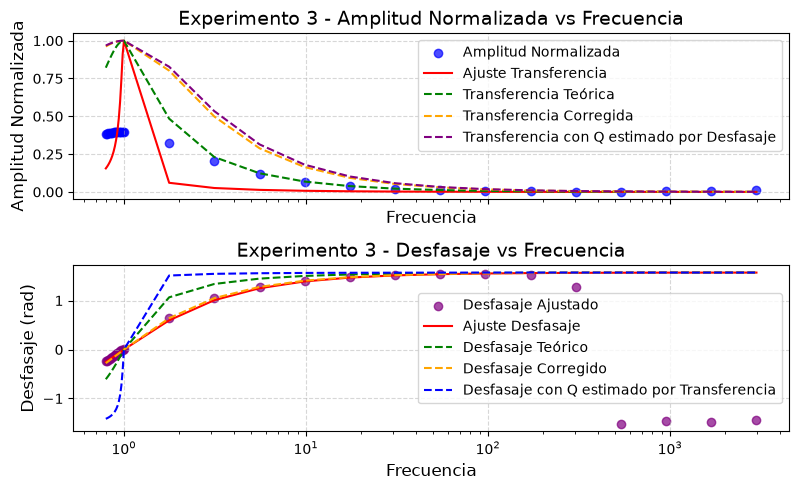

In [46]:
def analisis_experimento_7(): #CH1 en Circuito, no se considera la impedancia de salida
    experimento = experimento3
    R = experimento.R
    L = experimento.L
    C = experimento.C
    f0 = 1 / (2 * np.pi * np.sqrt(L * C))
    Q = 1 / R * np.sqrt(L / C)
    Qcorregido = 1 / (R + 301) * np.sqrt(L / C)
    frecuencias, datasets = recuperar_frecuencias_csvs(experimento.path)

    # Ordenar por frecuencia ascendente
    indices_ordenados = np.argsort(frecuencias)
    frecuencias = [frecuencias[i] for i in indices_ordenados]
    datasets = [datasets[i] for i in indices_ordenados]
    n = len(frecuencias)

    # Configurar cuadricula de subplots (3 columnas)
    ncols = 3
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 3.2 * nrows), sharex=False)
    axes = axes.flatten()

    amplitudes1 = []
    amplitudes2 = []
    phi1s = []
    phi2s = []

    for i in range(n):
        ax = axes[i]
        frecuencia = frecuencias[i]
        dataset = datasets[i]
        tiempos, v1s, v2s = obtener_tiempos_voltajes(dataset)

        popt1, pcov1 = ajustar_senoidal(tiempos, v1s, frecuencia)
        popt2, pcov2 = ajustar_senoidal(tiempos, v2s, frecuencia)

        t_fit = np.linspace(tiempos.min(), tiempos.max(), 500)
        fit1 = senoidal(t_fit, *popt1)
        fit2 = senoidal(t_fit, *popt2)

        # Scatter de datos crudos
        ax.scatter(tiempos, v1s, label='V1 (datos)', color='royalblue', alpha=0.4, s=6)
        ax.scatter(tiempos, v2s, label='V2 (datos)', color='darkorange', alpha=0.4, s=6)

        # Lineas de ajuste
        ax.plot(t_fit, fit1, label='V1 fit', color='blue', linewidth=1.5)
        ax.plot(t_fit, fit2, label='V2 fit', color='red', linewidth=1.5)

        ax.set_title(f'f = {frecuencia:.2f} Hz', fontsize=10, fontweight='bold')
        ax.set_xlabel('Tiempo (s)', fontsize=8)
        ax.set_ylabel('Voltaje (V)', fontsize=8)
        ax.grid(True, linestyle='--', alpha=0.5)
        if i == 0:
            ax.legend(fontsize=7, loc='upper right')

        amplitudes1.append(popt1[0])
        amplitudes2.append(popt2[0])
        phi1s.append(popt1[2])
        phi2s.append(popt2[2])

    # Ocultar ejes sobrantes
    for j in range(n, len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle(f'{experimento.label} - Scatter y Ajustes vs Tiempo', fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()

    amplitudes1 = np.array(amplitudes1)
    amplitudes2 = np.array(amplitudes2)

    amplitudes = amplitudes2

    amplitudesnorm = amplitudes/amplitudes1
    frecuencias_normalizadas = np.array(frecuencias) / f0

    popt_transferencia, pcov_transferencia = opt.curve_fit(transferencia, frecuencias_normalizadas, amplitudesnorm, p0=[Q])
    popt_desfasaje, pcov_desfasaje = opt.curve_fit(desfasajemodelo, frecuencias_normalizadas, arreglar_desfasajes(frecuencias_normalizadas, np.array(phi1s), np.array(phi2s)), p0=[Q])

    print("Frecuencia de resonancia (f0):", f0)
    print("El Q esperado es :", Q)
    print("El Q corregido es:", Qcorregido)
    print("El Q estimado es:", popt_transferencia[0])
    print("El Q estimado por desfasaje es:", popt_desfasaje[0])

    fig, ax = plt.subplots(2, 1, figsize=(8, 5), sharex=True)

    ax[0].scatter(frecuencias_normalizadas, amplitudesnorm, color='blue', label='Amplitud Normalizada', alpha=0.7)
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, *popt_transferencia), color='red', label='Ajuste Transferencia', linewidth=1.5)
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, Q), color='green', label='Transferencia Teórica', linewidth=1.5, linestyle='--')
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, Qcorregido), color='orange', label='Transferencia Corregida', linewidth=1.5, linestyle='--')
    ax[0].plot(frecuencias_normalizadas, transferencia(frecuencias_normalizadas, popt_desfasaje[0]), color='purple', label='Transferencia con Q estimado por Desfasaje', linewidth=1.5, linestyle='--')

    ax[0].set_xscale('log')
    ax[0].set_ylabel('Amplitud Normalizada', fontsize=12)
    ax[0].set_title(f'{experimento.label} - Amplitud Normalizada vs Frecuencia', fontsize=14)
    ax[0].grid(True, linestyle='--', alpha=0.5)
    ax[0].legend(fontsize=10)
    ax[0].set_xlabel('Frecuencia', fontsize=12)

    ax[1].scatter(frecuencias_normalizadas, arreglar_desfasajes(frecuencias_normalizadas, np.array(phi1s), np.array(phi2s)), color='purple', label='Desfasaje Ajustado', alpha=0.7)
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, *popt_desfasaje), color='red', label='Ajuste Desfasaje', linewidth=1.5)
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, -Q), color='green', label='Desfasaje Teórico', linewidth=1.5, linestyle='--')
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, -Qcorregido), color='orange', label='Desfasaje Corregido', linewidth=1.5, linestyle='--')
    ax[1].plot(frecuencias_normalizadas, desfasajemodelo(frecuencias_normalizadas, -popt_transferencia[0]), color='blue', label='Desfasaje con Q estimado por Transferencia', linewidth=1.5, linestyle='--')

    ax[1].set_xscale('log')
    ax[1].set_xlabel('Frecuencia', fontsize=12)
    ax[1].set_ylabel('Desfasaje (rad)', fontsize=12)
    ax[1].set_title(f'{experimento.label} - Desfasaje vs Frecuencia', fontsize=14)
    ax[1].grid(True, linestyle='--', alpha=0.5)
    ax[1].legend(fontsize=10)

    plt.tight_layout()
    plt.show()

analisis_experimento_7()